In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 32.2 MB/s eta 0:00:00


In [3]:
!pip install torchmetrics scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 21.1 MB/s eta 0:00:00


In [4]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from google.colab import drive, files
import scipy.io as sio
import os

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
import scipy.io as sio
import numpy as np
import cv2
import os
from pathlib import Path
import h5py
import yaml

In [7]:
!wget -q http://ufldl.stanford.edu/housenumbers/train.tar.gz
!wget -q http://ufldl.stanford.edu/housenumbers/test.tar.gz

In [8]:
!tar -xzf train.tar.gz
!tar -xzf test.tar.gz

In [9]:
BASE_DIR = Path('/content/svhn_yolo')
for split in ['train', 'val']:
    (BASE_DIR / 'images' / split).mkdir(parents=True, exist_ok=True)
    (BASE_DIR / 'labels' / split).mkdir(parents=True, exist_ok=True)

def get_name(f, idx):
    name_ref = f['/digitStruct/name'][idx, 0]
    return ''.join([chr(v[0]) for v in f[name_ref]])

def get_bbox(f, idx):
    bbox_ref = f['/digitStruct/bbox'][idx, 0]
    bbox_data = f[bbox_ref]

    def extract_attr(attr):
        if len(bbox_data[attr]) > 1:
            return [f[bbox_data[attr][i, 0]][0, 0] for i in range(len(bbox_data[attr]))]
        else:
            return [bbox_data[attr][0, 0]]

    labels = extract_attr('label')
    tops = extract_attr('top')
    lefts = extract_attr('left')
    widths = extract_attr('width')
    heights = extract_attr('height')

    return [{'label': int(l), 'top': t, 'left': lft, 'width': w, 'height': h}
            for l, t, lft, w, h in zip(labels, tops, lefts, widths, heights)]

def convert_svhn_to_yolo(mat_path, img_dir, split_name, max_images=None):
    print(f"Обработка {split_name}...")
    f = h5py.File(mat_path, 'r')
    num_images = len(f['/digitStruct/name'])
    if max_images: num_images = min(num_images, max_images)

    for i in range(num_images):
        if i % 5000 == 0: print(f"  Обработано {i}/{num_images} картинок")

        img_name = get_name(f, i)
        bboxes = get_bbox(f, i)

        src_img_path = os.path.join(img_dir, img_name)
        dst_img_path = BASE_DIR / 'images' / split_name / img_name

        img = cv2.imread(src_img_path)
        if img is None: continue

        cv2.imwrite(str(dst_img_path), img)
        img_h, img_w = img.shape[:2]

        label_path = BASE_DIR / 'labels' / split_name / img_name.replace('.png', '.txt')
        with open(label_path, 'w') as out_f:
            for bbox in bboxes:
                class_id = 0 if bbox['label'] == 10 else bbox['label']

                x_center = (bbox['left'] + bbox['width'] / 2.0) / img_w
                y_center = (bbox['top'] + bbox['height'] / 2.0) / img_h
                w = bbox['width'] / img_w
                h = bbox['height'] / img_h

                x_center, y_center = max(0, min(1, x_center)), max(0, min(1, y_center))
                w, h = max(0, min(1, w)), max(0, min(1, h))

                out_f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}\n")

convert_svhn_to_yolo('train/digitStruct.mat', 'train', 'train', max_images=15000)
convert_svhn_to_yolo('test/digitStruct.mat', 'test', 'val', max_images=5000)

yaml_content = {
    'path': '/content/svhn_yolo',
    'train': 'images/train',
    'val': 'images/val',
    'names': {0: '0', 1: '1', 2: '2', 3: '3', 4: '4', 5: '5', 6: '6', 7: '7', 8: '8', 9: '9'}
}

with open('/content/svhn_yolo/dataset.yaml', 'w') as f:
    yaml.dump(yaml_content, f, sort_keys=False)

print("Датасет успешно подготовлен!")

Обработка train...
  Обработано 0/15000 картинок
  Обработано 5000/15000 картинок
  Обработано 10000/15000 картинок
Обработка val...
  Обработано 0/5000 картинок
Датасет успешно подготовлен!


In [10]:
from ultralytics import YOLO

In [11]:
print("дообучение модели YOLOv8 на SVHN:")

model = YOLO('yolov8n.pt')

results = model.train(
    data='/content/svhn_yolo/dataset.yaml',
    epochs=5,
    imgsz=640,
    batch=16,
    device=0,
    workers=2,
    patience=5
)


дообучение модели YOLOv8 на SVHN:
Ultralytics 8.4.33 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/svhn_yolo/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask

In [12]:
metrics = model.val(data='/content/svhn_yolo/dataset.yaml', conf=0.25)

print("\nрезультаты")
print(f"mAP@0.5: {metrics.box.map50:.3f}")
print(f"mAP@0.5:0.95: {metrics.box.map:.3f}")
print(f"Precision: {metrics.box.mp:.3f}")
print(f"Recall: {metrics.box.mr:.3f}")

if metrics.box.map50 >= 0.6:
    print("\n✅mAP >= 0.6")
else:
    print(f"\n❌ mAP={metrics.box.map50:.3f} < 0.6")

Ultralytics 8.4.33 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 495.6±438.2 MB/s, size: 11.1 KB)
val: Scanning /content/svhn_yolo/labels/val.cache... 5000 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 5000/5000 2.1Git/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 313/313 10.3it/s 30.5s
                   all       5000       9939      0.842      0.793      0.843      0.416
                     0        652        677      0.852      0.818      0.869      0.445
                     1       1765       1958      0.832      0.692      0.756      0.323
                     2       1486       1577      0.865      0.844      0.881      0.441
                     3       1024       1096      0.897      0.736       0.84       0.42
                     4        917        964

In [13]:
def detect_numbers(image_path, model, confidence=0.25):
    """
    Детектирует номера/цифры на изображении

    Args:
        image_path: путь к изображению
        model: загруженная модель YOLO
        confidence: порог уверенности (0-1)

    Returns:
        img: изображение с отрисованными bounding boxes
        detections: список обнаруженных объектов
    """
    img = cv2.imread(image_path)
    if img is None:
        print(f"Ошибка: не удалось загрузить {image_path}")
        return None, []

    original_img = img.copy()

    results = model(image_path, conf=confidence)

    detections = []

    for r in results:
        if r.boxes is not None:
            boxes = r.boxes.xyxy.cpu().numpy()
            confidences = r.boxes.conf.cpu().numpy()
            classes = r.boxes.cls.cpu().numpy()

            for box, conf, cls in zip(boxes, confidences, classes):
                x1, y1, x2, y2 = map(int, box[:4])
                label = f"{int(cls)}: {conf:.2f}"

                cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(img, label, (x1, y1-5),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

                detections.append({
                    'bbox': [x1, y1, x2, y2],
                    'confidence': float(conf),
                    'class': int(cls)
                })

    return img, detections

def visualize_detection(image_path, model):
    """Визуализирует результат детекции"""
    img, detections = detect_numbers(image_path, model)

    if img is not None:
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Обнаружено объектов: {len(detections)}")
        plt.axis('off')
        plt.show()

        print(f"Найдено {len(detections)} объектов:")
        for i, det in enumerate(detections, 1):
            print(f"  {i}. Цифра {det['class']}, уверенность: {det['confidence']:.2f}, позиция: {det['bbox']}")

        return detections
    return []

In [15]:
def process_user_photos():

    photos_path = '/content/drive/MyDrive/ML5lw/my_images/'

    os.makedirs('/content/drive/MyDrive/ML5lw/detection_results', exist_ok=True)

    image_extensions = ['.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG']
    photos = []

    photos = [f for f in os.listdir(photos_path)]


    for i, photo in enumerate(photos, 1):
        print(f"\nОбработка фото {i}/{len(photos)}: {photo}")
        photo_path = os.path.join(photos_path, photo)

        img, detections = detect_numbers(photo_path, model)

        if img is not None:
            result_path = f'/content/drive/MyDrive/detection_results/detected_{photo}'
            cv2.imwrite(result_path, img)

            visualize_detection(photo_path, model)
            print(f"Результат сохранен: {result_path}")

обработка моих фотографий

Обработка фото 1/25: 9.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/9.jpg: 640x544 1 0, 1 2, 1 3, 39.3ms
Speed: 2.5ms preprocess, 39.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/9.jpg: 640x544 1 0, 1 2, 1 3, 7.0ms
Speed: 2.1ms preprocess, 7.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 544)


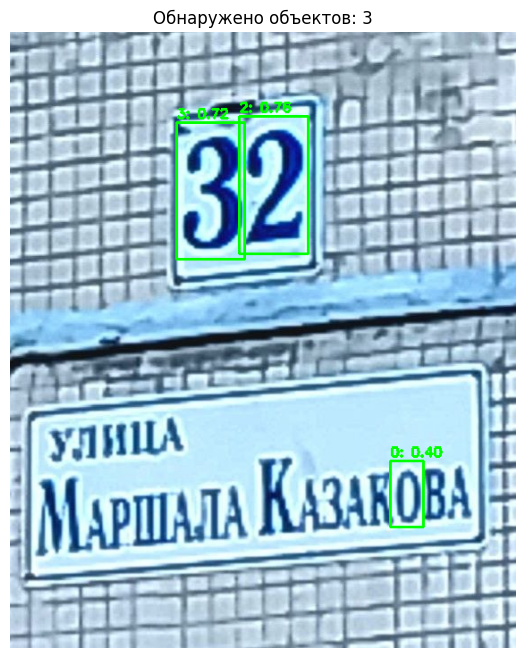

Найдено 3 объектов:
  1. Цифра 2, уверенность: 0.76, позиция: [256, 94, 333, 248]
  2. Цифра 3, уверенность: 0.72, позиция: [186, 101, 262, 254]
  3. Цифра 0, уверенность: 0.40, позиция: [425, 480, 462, 554]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_9.jpg

Обработка фото 2/25: 18.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/18.jpg: 640x640 1 0, 1 1, 1 2, 2 3s, 1 5, 1 8, 8.4ms
Speed: 3.7ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/18.jpg: 640x640 1 0, 1 1, 1 2, 2 3s, 1 5, 1 8, 7.2ms
Speed: 3.4ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


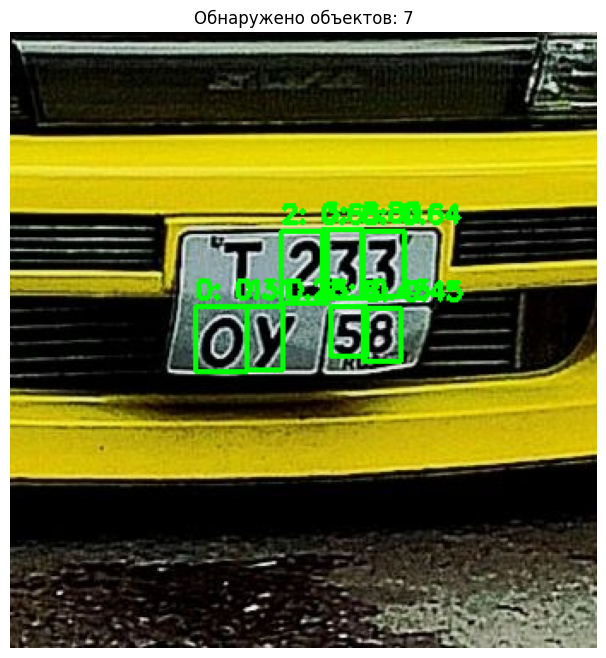

Найдено 7 объектов:
  1. Цифра 3, уверенность: 0.80, позиция: [182, 115, 206, 155]
  2. Цифра 2, уверенность: 0.65, позиция: [158, 116, 185, 158]
  3. Цифра 3, уверенность: 0.64, позиция: [205, 116, 230, 154]
  4. Цифра 8, уверенность: 0.45, позиция: [206, 161, 228, 192]
  5. Цифра 5, уверенность: 0.43, позиция: [187, 160, 208, 189]
  6. Цифра 0, уверенность: 0.31, позиция: [108, 160, 138, 198]
  7. Цифра 1, уверенность: 0.28, позиция: [138, 160, 159, 197]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_18.jpg

Обработка фото 3/25: 6.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/6.jpg: 512x640 2 0s, 3 4s, 70.3ms
Speed: 5.3ms preprocess, 70.3ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/6.jpg: 512x640 2 0s, 3 4s, 8.1ms
Speed: 5.1ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


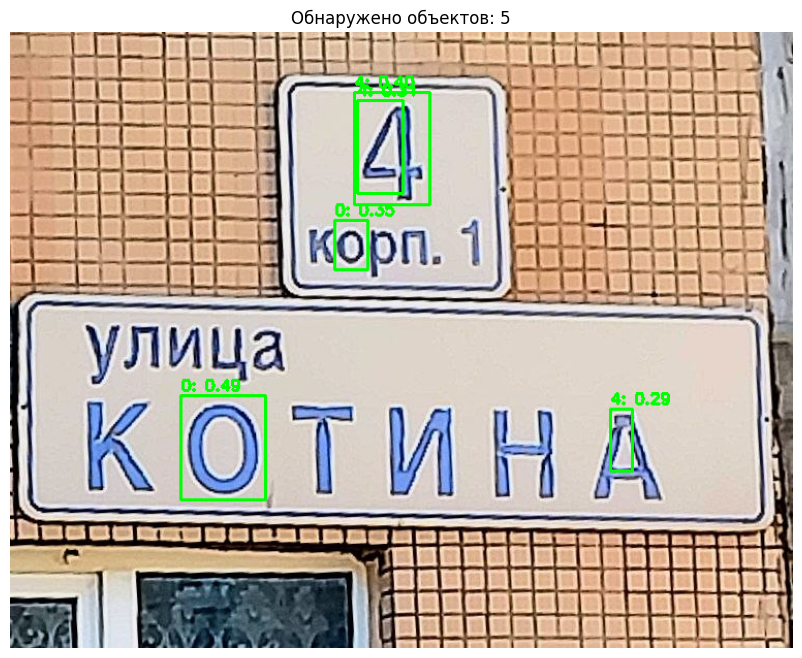

Найдено 5 объектов:
  1. Цифра 0, уверенность: 0.49, позиция: [165, 352, 247, 453]
  2. Цифра 4, уверенность: 0.40, позиция: [333, 58, 406, 167]
  3. Цифра 0, уверенность: 0.35, позиция: [314, 182, 346, 230]
  4. Цифра 4, уверенность: 0.31, позиция: [336, 66, 380, 156]
  5. Цифра 4, уверенность: 0.29, позиция: [581, 365, 602, 425]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_6.jpg

Обработка фото 4/25: 20.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/20.jpg: 640x608 1 1, 4 8s, 1 9, 61.9ms
Speed: 3.7ms preprocess, 61.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 608)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/20.jpg: 640x608 1 1, 4 8s, 1 9, 11.2ms
Speed: 4.1ms preprocess, 11.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 608)


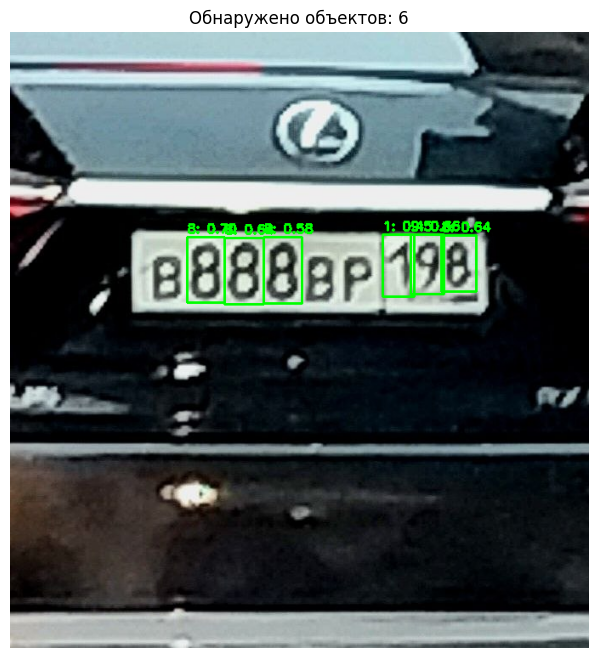

Найдено 6 объектов:
  1. Цифра 8, уверенность: 0.70, позиция: [208, 241, 252, 318]
  2. Цифра 9, уверенность: 0.66, позиция: [471, 238, 510, 308]
  3. Цифра 8, уверенность: 0.64, позиция: [252, 242, 298, 320]
  4. Цифра 8, уверенность: 0.64, позиция: [507, 239, 548, 305]
  5. Цифра 8, уверенность: 0.58, позиция: [298, 241, 343, 319]
  6. Цифра 1, уверенность: 0.45, позиция: [438, 238, 475, 311]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_20.jpg

Обработка фото 5/25: 11.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/11.jpg: 544x640 2 2s, 100.0ms
Speed: 6.2ms preprocess, 100.0ms inference, 2.7ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/11.jpg: 544x640 2 2s, 10.1ms
Speed: 4.0ms preprocess, 10.1ms inference, 2.0ms postprocess per image at shape (1, 3, 544, 640)


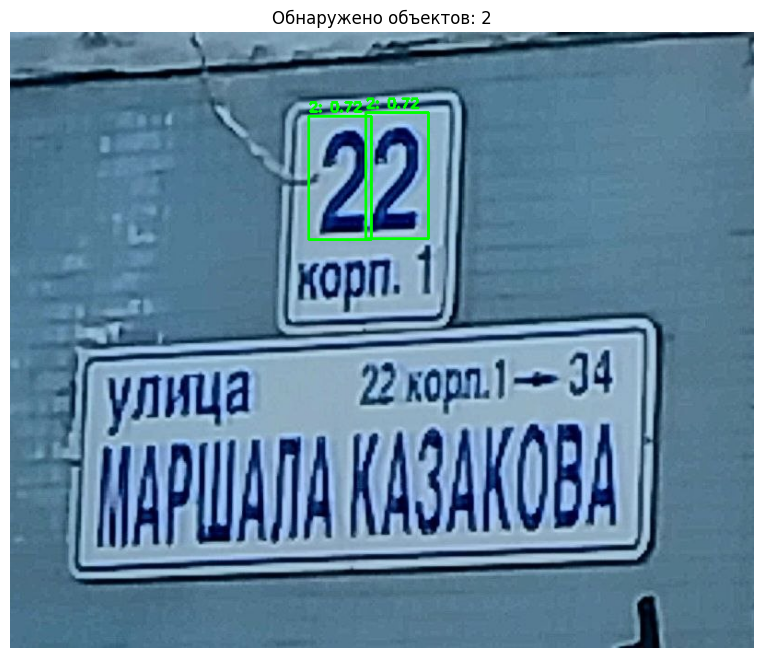

Найдено 2 объектов:
  1. Цифра 2, уверенность: 0.72, позиция: [324, 91, 392, 225]
  2. Цифра 2, уверенность: 0.72, позиция: [386, 87, 454, 224]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_11.jpg

Обработка фото 6/25: 8.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/8.jpg: 640x576 1 3, 1 6, 50.1ms
Speed: 4.5ms preprocess, 50.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/8.jpg: 640x576 1 3, 1 6, 7.4ms
Speed: 4.0ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 576)


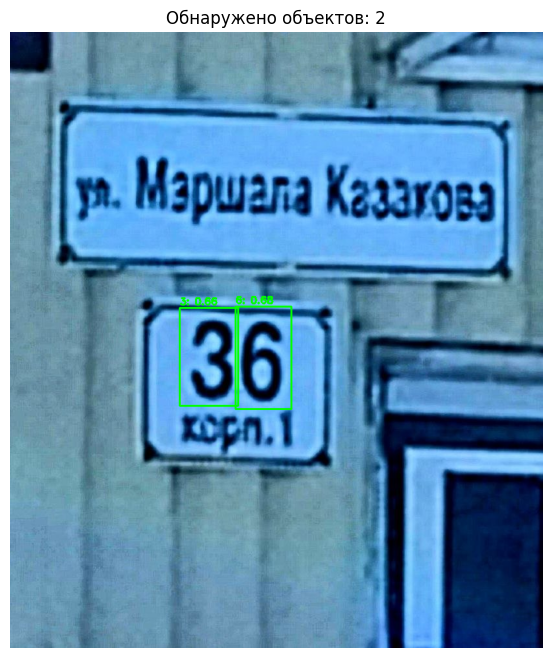

Найдено 2 объектов:
  1. Цифра 6, уверенность: 0.68, позиция: [347, 423, 433, 581]
  2. Цифра 3, уверенность: 0.66, позиция: [261, 425, 351, 576]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_8.jpg

Обработка фото 7/25: 7.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/7.jpg: 640x640 1 0, 1 1, 1 4, 1 6, 8.7ms
Speed: 4.1ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/7.jpg: 640x640 1 0, 1 1, 1 4, 1 6, 8.4ms
Speed: 4.5ms preprocess, 8.4ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


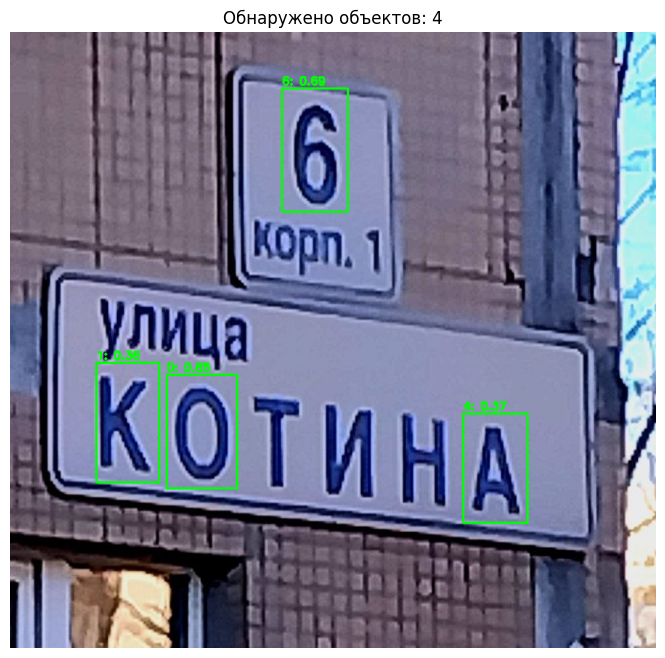

Найдено 4 объектов:
  1. Цифра 6, уверенность: 0.69, позиция: [363, 75, 451, 240]
  2. Цифра 0, уверенность: 0.65, позиция: [209, 458, 303, 610]
  3. Цифра 4, уверенность: 0.37, позиция: [605, 510, 691, 656]
  4. Цифра 1, уверенность: 0.36, позиция: [115, 442, 199, 602]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_7.jpg

Обработка фото 8/25: 23.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/23.jpg: 288x640 3 0s, 1 4, 1 8, 1 9, 54.9ms
Speed: 2.1ms preprocess, 54.9ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/23.jpg: 288x640 3 0s, 1 4, 1 8, 1 9, 7.5ms
Speed: 2.0ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 640)


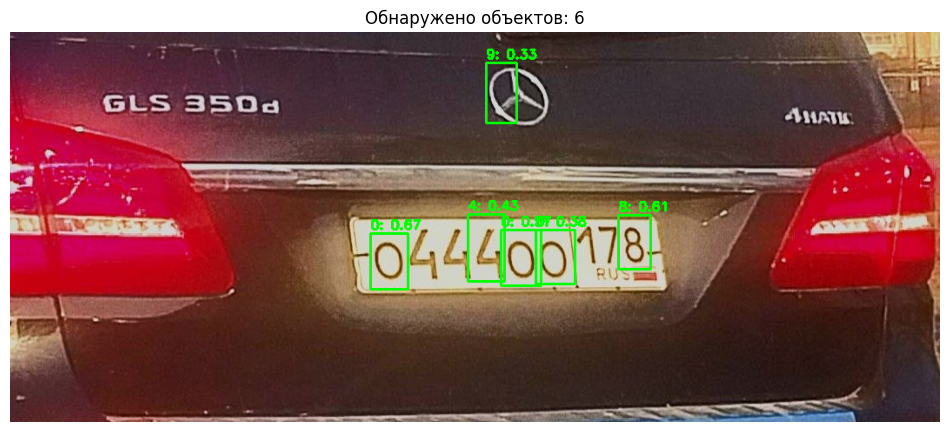

Найдено 6 объектов:
  1. Цифра 0, уверенность: 0.67, позиция: [414, 231, 457, 295]
  2. Цифра 8, уверенность: 0.61, позиция: [699, 210, 736, 272]
  3. Цифра 0, уверенность: 0.57, позиция: [564, 227, 610, 291]
  4. Цифра 4, уверенность: 0.43, позиция: [526, 209, 568, 286]
  5. Цифра 0, уверенность: 0.38, позиция: [604, 227, 649, 289]
  6. Цифра 9, уверенность: 0.33, позиция: [547, 35, 582, 104]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_23.jpg

Обработка фото 9/25: 12.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/12.jpg: 512x640 1 1, 1 3, 10.0ms
Speed: 3.6ms preprocess, 10.0ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/12.jpg: 512x640 1 1, 1 3, 7.8ms
Speed: 3.6ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


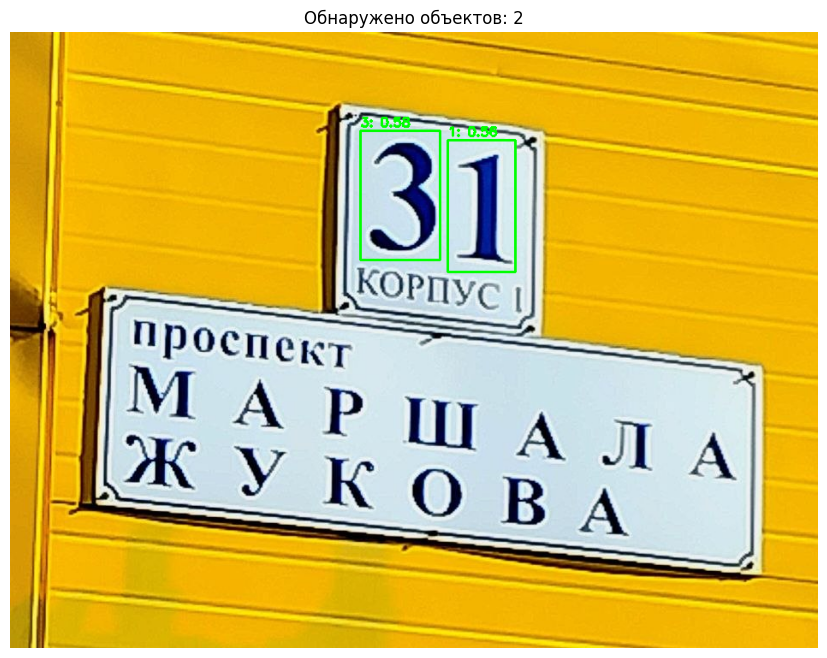

Найдено 2 объектов:
  1. Цифра 3, уверенность: 0.58, позиция: [409, 115, 502, 266]
  2. Цифра 1, уверенность: 0.56, позиция: [511, 126, 590, 280]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_12.jpg

Обработка фото 10/25: 13.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/13.jpg: 480x640 1 0, 2 3s, 1 4, 61.4ms
Speed: 3.5ms preprocess, 61.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/13.jpg: 480x640 1 0, 2 3s, 1 4, 7.8ms
Speed: 3.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


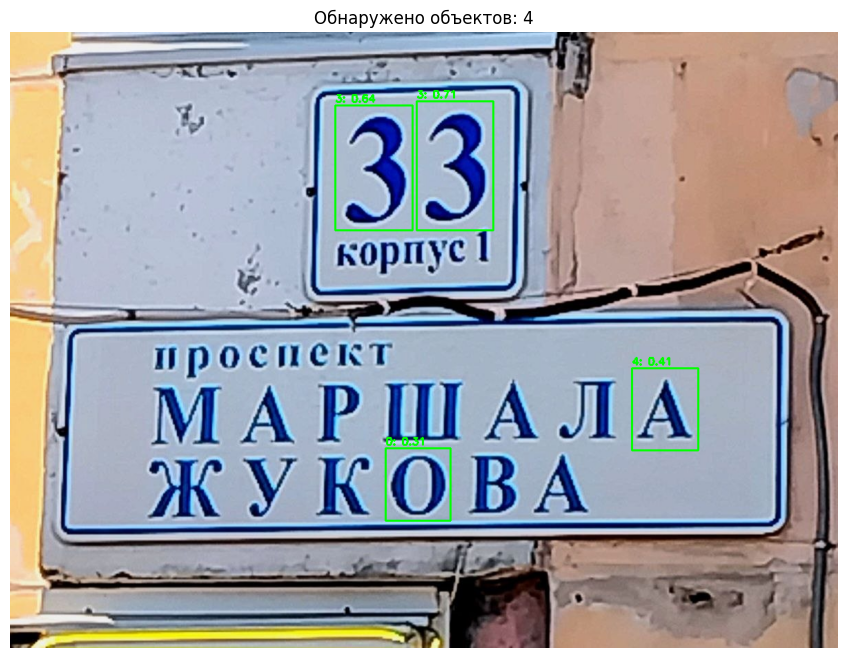

Найдено 4 объектов:
  1. Цифра 3, уверенность: 0.71, позиция: [589, 100, 700, 287]
  2. Цифра 3, уверенность: 0.64, позиция: [471, 106, 583, 287]
  3. Цифра 4, уверенность: 0.41, позиция: [901, 487, 997, 606]
  4. Цифра 0, уверенность: 0.31, позиция: [544, 603, 638, 708]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_13.jpg

Обработка фото 11/25: 1.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/1.jpg: 512x640 1 6, 1 9, 8.8ms
Speed: 4.4ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/1.jpg: 512x640 1 6, 1 9, 7.8ms
Speed: 3.9ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


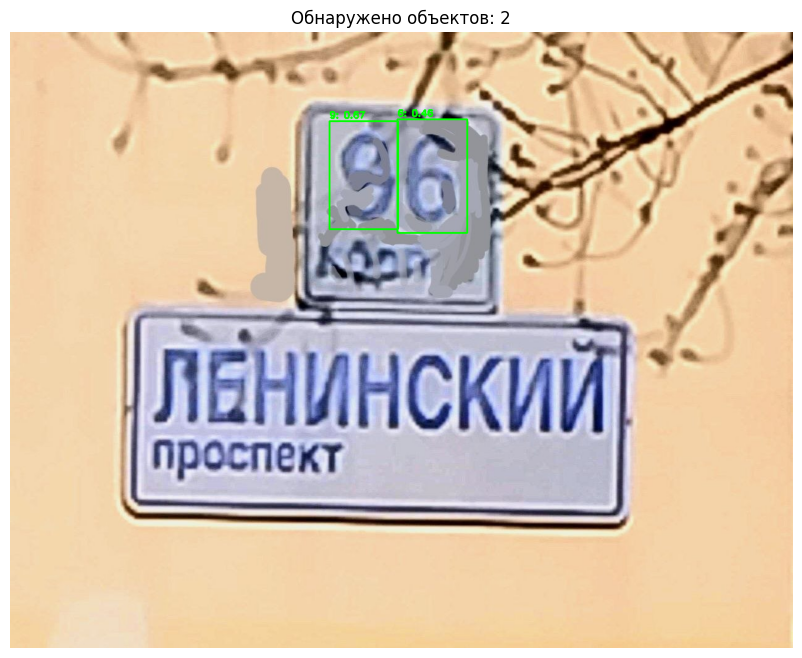

Найдено 2 объектов:
  1. Цифра 9, уверенность: 0.67, позиция: [517, 144, 628, 319]
  2. Цифра 6, уверенность: 0.46, позиция: [627, 141, 740, 325]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_1.jpg

Обработка фото 12/25: 24.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/24.jpg: 288x640 3 0s, 1 4, 1 8, 1 9, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 288, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/24.jpg: 288x640 3 0s, 1 4, 1 8, 1 9, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 288, 640)


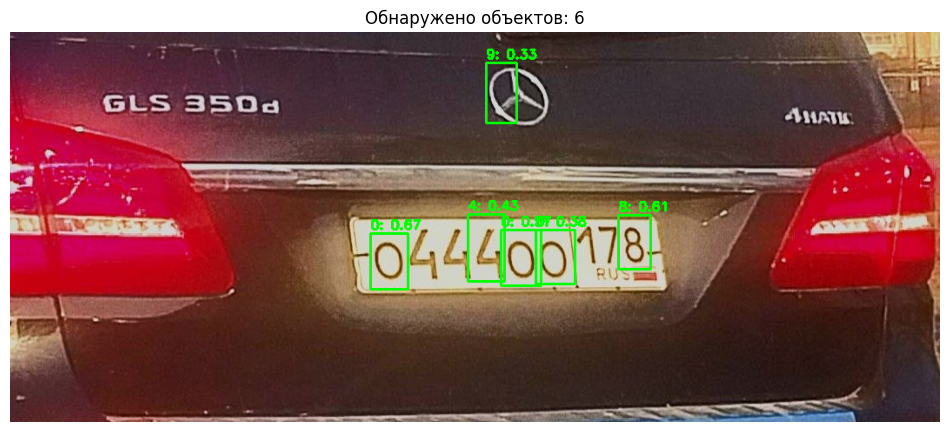

Найдено 6 объектов:
  1. Цифра 0, уверенность: 0.67, позиция: [414, 231, 457, 295]
  2. Цифра 8, уверенность: 0.61, позиция: [699, 210, 736, 272]
  3. Цифра 0, уверенность: 0.57, позиция: [564, 227, 610, 291]
  4. Цифра 4, уверенность: 0.43, позиция: [526, 209, 568, 286]
  5. Цифра 0, уверенность: 0.38, позиция: [604, 227, 649, 289]
  6. Цифра 9, уверенность: 0.33, позиция: [547, 35, 582, 104]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_24.jpg

Обработка фото 13/25: 14.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/14.jpg: 256x640 1 3, 1 5, 59.3ms
Speed: 2.0ms preprocess, 59.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/14.jpg: 256x640 1 3, 1 5, 8.6ms
Speed: 2.1ms preprocess, 8.6ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 640)


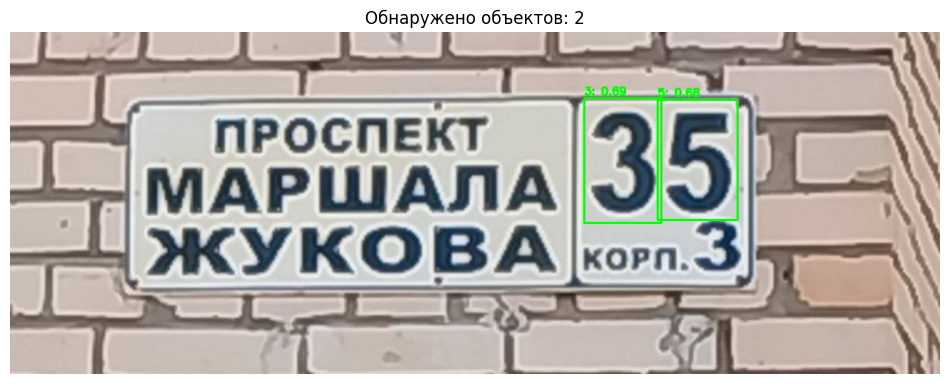

Найдено 2 объектов:
  1. Цифра 3, уверенность: 0.69, позиция: [790, 92, 896, 263]
  2. Цифра 5, уверенность: 0.68, позиция: [891, 94, 1001, 259]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_14.jpg

Обработка фото 14/25: 16.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/16.jpg: 480x640 2 0s, 2 8s, 8.9ms
Speed: 2.8ms preprocess, 8.9ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/16.jpg: 480x640 2 0s, 2 8s, 11.4ms
Speed: 5.6ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


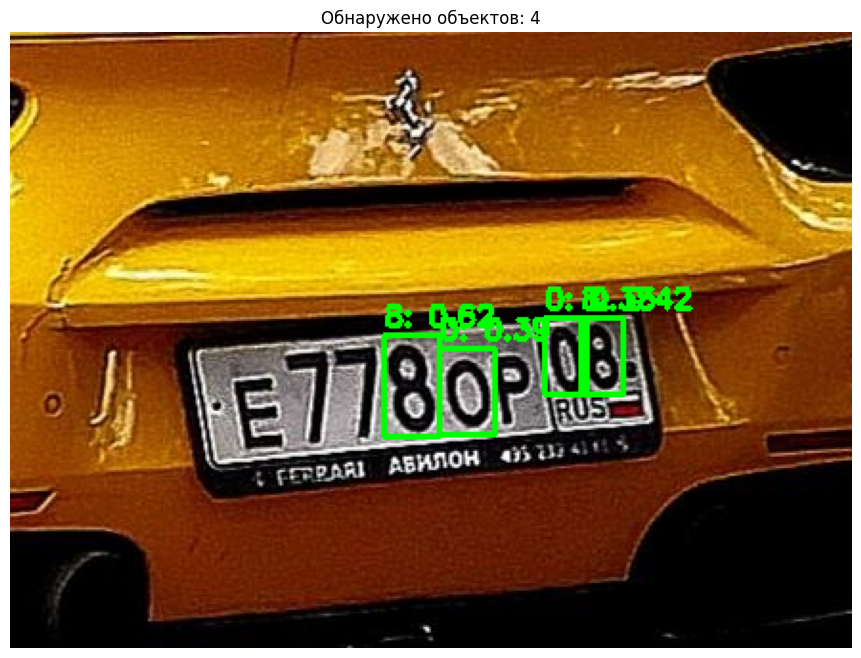

Найдено 4 объектов:
  1. Цифра 8, уверенность: 0.62, позиция: [195, 158, 224, 211]
  2. Цифра 8, уверенность: 0.42, позиция: [298, 149, 320, 189]
  3. Цифра 0, уверенность: 0.39, позиция: [224, 165, 253, 210]
  4. Цифра 0, уверенность: 0.33, позиция: [279, 149, 301, 189]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_16.jpg

Обработка фото 15/25: 25.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/25.jpg: 256x640 1 0, 1 3, 1 8, 1 9, 8.4ms
Speed: 1.9ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/25.jpg: 256x640 1 0, 1 3, 1 8, 1 9, 8.5ms
Speed: 1.7ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 640)


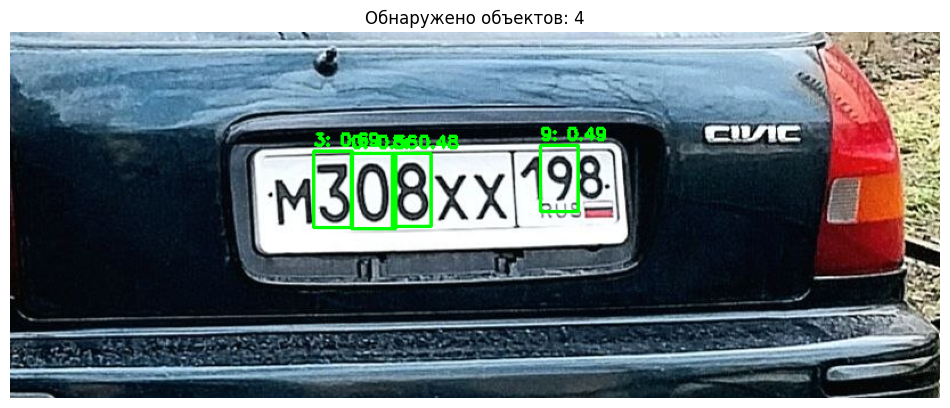

Найдено 4 объектов:
  1. Цифра 3, уверенность: 0.69, позиция: [266, 104, 300, 171]
  2. Цифра 0, уверенность: 0.56, позиция: [299, 106, 338, 172]
  3. Цифра 9, уверенность: 0.49, позиция: [465, 99, 498, 157]
  4. Цифра 8, уверенность: 0.48, позиция: [335, 106, 369, 170]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_25.jpg

Обработка фото 16/25: 17.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/17.jpg: 448x640 1 2, 1 7, 5 8s, 66.2ms
Speed: 2.9ms preprocess, 66.2ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/17.jpg: 448x640 1 2, 1 7, 5 8s, 9.4ms
Speed: 2.8ms preprocess, 9.4ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


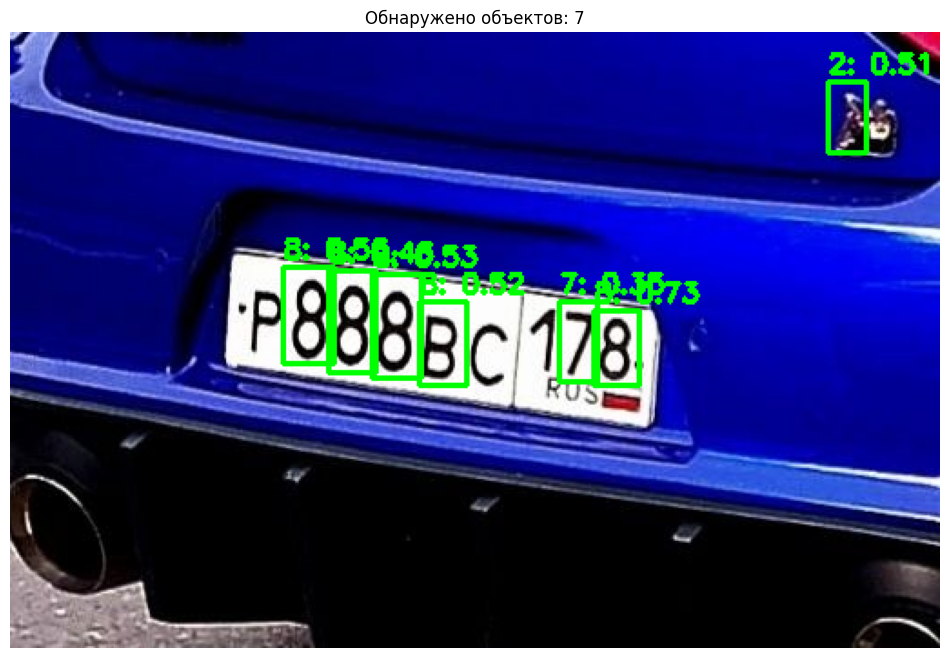

Найдено 7 объектов:
  1. Цифра 8, уверенность: 0.73, позиция: [321, 153, 346, 194]
  2. Цифра 8, уверенность: 0.56, позиция: [150, 129, 178, 182]
  3. Цифра 8, уверенность: 0.53, позиция: [199, 133, 226, 190]
  4. Цифра 8, уверенность: 0.52, позиция: [225, 148, 251, 194]
  5. Цифра 2, уверенность: 0.51, позиция: [450, 27, 471, 66]
  6. Цифра 8, уверенность: 0.46, позиция: [175, 131, 201, 187]
  7. Цифра 7, уверенность: 0.35, позиция: [302, 148, 323, 192]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_17.jpg

Обработка фото 17/25: 15.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/15.jpg: 640x576 1 0, 2 2s, 1 5, 1 6, 11.0ms
Speed: 6.8ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/15.jpg: 640x576 1 0, 2 2s, 1 5, 1 6, 7.5ms
Speed: 4.1ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 576)


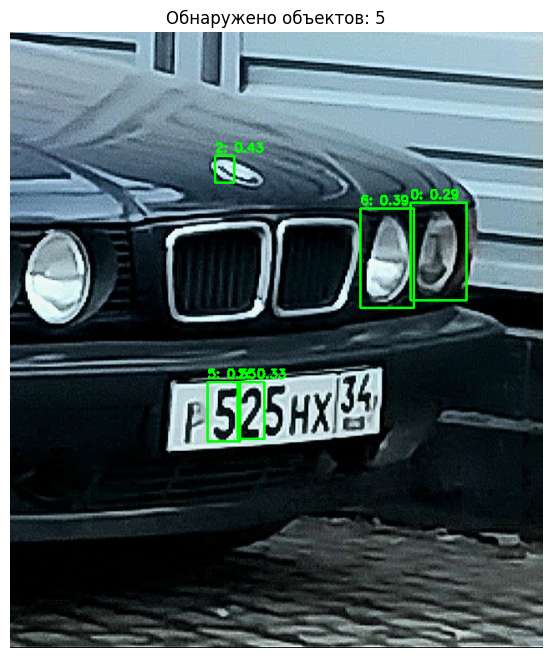

Найдено 5 объектов:
  1. Цифра 5, уверенность: 0.55, позиция: [236, 419, 275, 490]
  2. Цифра 2, уверенность: 0.43, позиция: [245, 148, 268, 180]
  3. Цифра 6, уверенность: 0.39, позиция: [419, 211, 483, 330]
  4. Цифра 2, уверенность: 0.33, позиция: [272, 419, 304, 487]
  5. Цифра 0, уверенность: 0.29, позиция: [479, 204, 546, 321]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_15.jpg

Обработка фото 18/25: 22.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/22.jpg: 256x640 1 0, 1 3, 2 5s, 1 6, 1 8, 15.2ms
Speed: 2.3ms preprocess, 15.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/22.jpg: 256x640 1 0, 1 3, 2 5s, 1 6, 1 8, 8.3ms
Speed: 2.1ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 640)


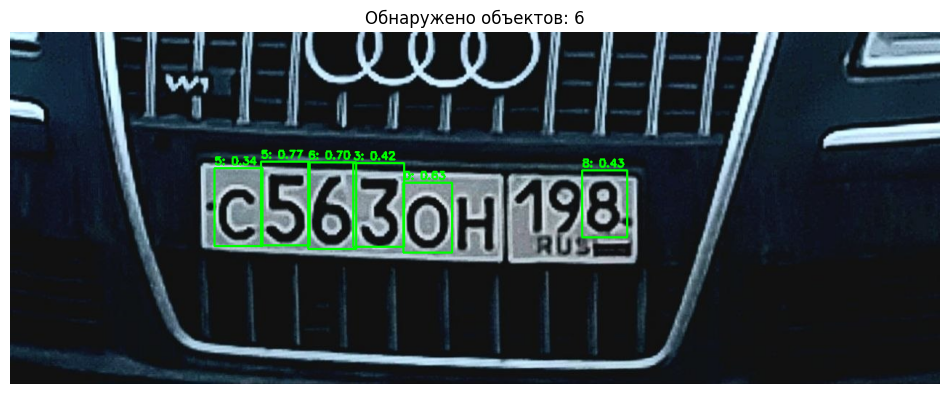

Найдено 6 объектов:
  1. Цифра 5, уверенность: 0.77, позиция: [345, 179, 412, 294]
  2. Цифра 6, уверенность: 0.70, позиция: [410, 180, 476, 299]
  3. Цифра 0, уверенность: 0.63, позиция: [541, 208, 608, 304]
  4. Цифра 8, уверенность: 0.43, позиция: [787, 191, 849, 283]
  5. Цифра 3, уверенность: 0.42, позиция: [472, 181, 542, 296]
  6. Цифра 5, уверенность: 0.34, позиция: [281, 188, 347, 295]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_22.jpg

Обработка фото 19/25: 3.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/3.jpg: 640x640 1 0, 1 1, 1 4, 1 6, 11.0ms
Speed: 6.5ms preprocess, 11.0ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/3.jpg: 640x640 1 0, 1 1, 1 4, 1 6, 12.2ms
Speed: 4.6ms preprocess, 12.2ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


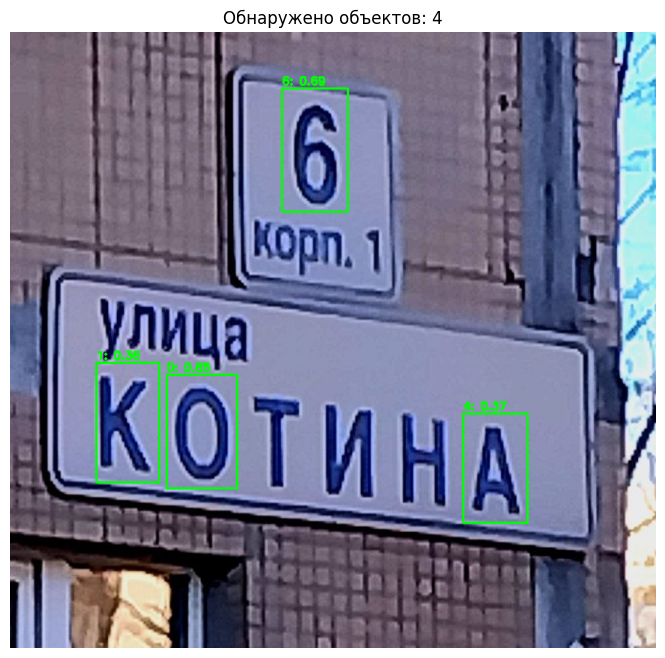

Найдено 4 объектов:
  1. Цифра 6, уверенность: 0.69, позиция: [363, 75, 451, 240]
  2. Цифра 0, уверенность: 0.65, позиция: [209, 458, 303, 610]
  3. Цифра 4, уверенность: 0.37, позиция: [605, 510, 691, 656]
  4. Цифра 1, уверенность: 0.36, позиция: [115, 442, 199, 602]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_3.jpg

Обработка фото 20/25: 5.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/5.jpg: 576x640 1 0, 3 2s, 1 8, 84.7ms
Speed: 6.6ms preprocess, 84.7ms inference, 3.8ms postprocess per image at shape (1, 3, 576, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/5.jpg: 576x640 1 0, 3 2s, 1 8, 10.0ms
Speed: 6.0ms preprocess, 10.0ms inference, 1.7ms postprocess per image at shape (1, 3, 576, 640)


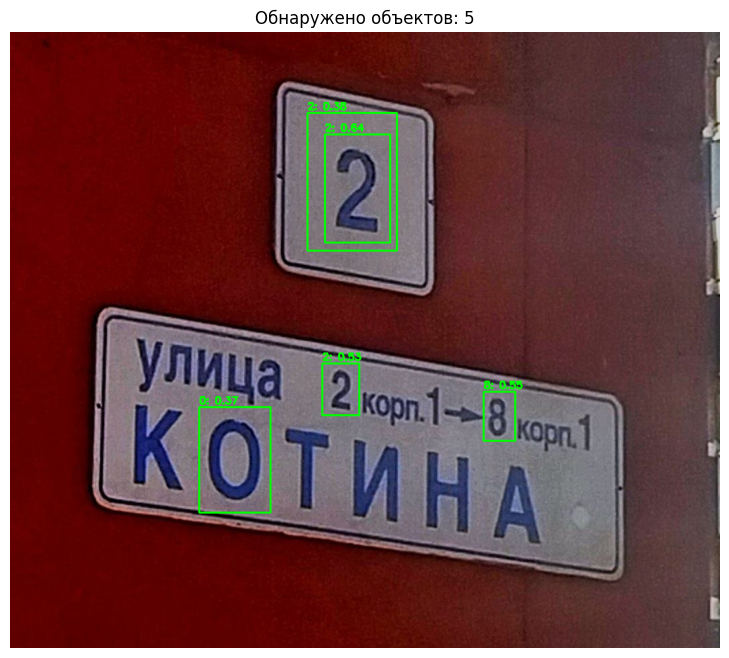

Найдено 5 объектов:
  1. Цифра 2, уверенность: 0.64, позиция: [468, 152, 565, 313]
  2. Цифра 8, уверенность: 0.55, позиция: [704, 535, 751, 608]
  3. Цифра 2, уверенность: 0.53, позиция: [464, 493, 519, 570]
  4. Цифра 2, уверенность: 0.38, позиция: [442, 120, 575, 325]
  5. Цифра 0, уверенность: 0.37, позиция: [281, 558, 387, 715]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_5.jpg

Обработка фото 21/25: 4.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/4.jpg: 448x640 1 0, 1 9, 18.8ms
Speed: 7.1ms preprocess, 18.8ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/4.jpg: 448x640 1 0, 1 9, 16.7ms
Speed: 5.4ms preprocess, 16.7ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)


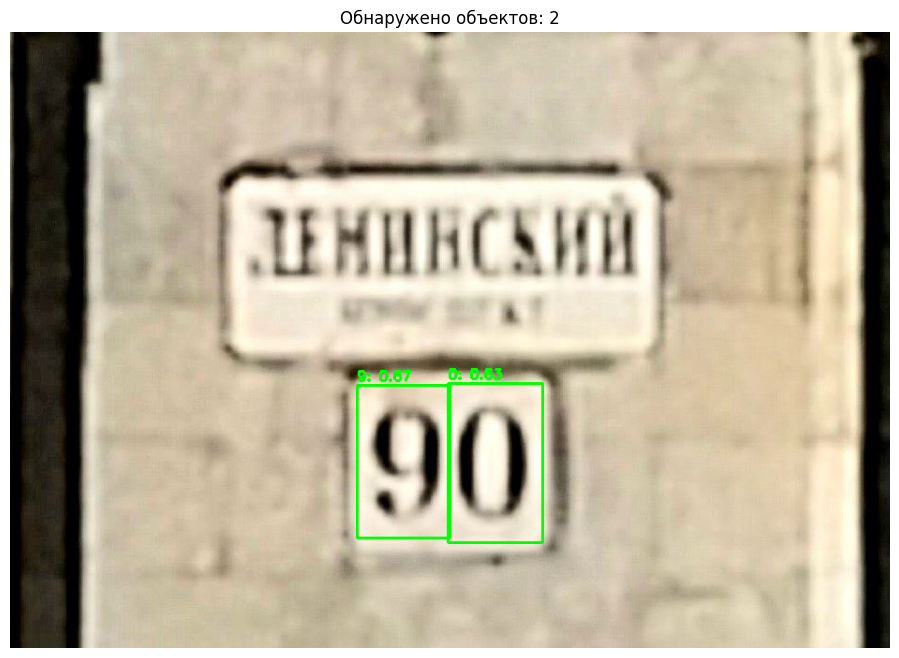

Найдено 2 объектов:
  1. Цифра 9, уверенность: 0.67, позиция: [370, 377, 469, 540]
  2. Цифра 0, уверенность: 0.63, позиция: [467, 375, 568, 545]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_4.jpg

Обработка фото 22/25: 19.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/19.jpg: 384x640 1 0, 1 1, 1 2, 1 3, 1 5, 1 8, 1 9, 97.8ms
Speed: 2.5ms preprocess, 97.8ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/19.jpg: 384x640 1 0, 1 1, 1 2, 1 3, 1 5, 1 8, 1 9, 15.2ms
Speed: 2.9ms preprocess, 15.2ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)


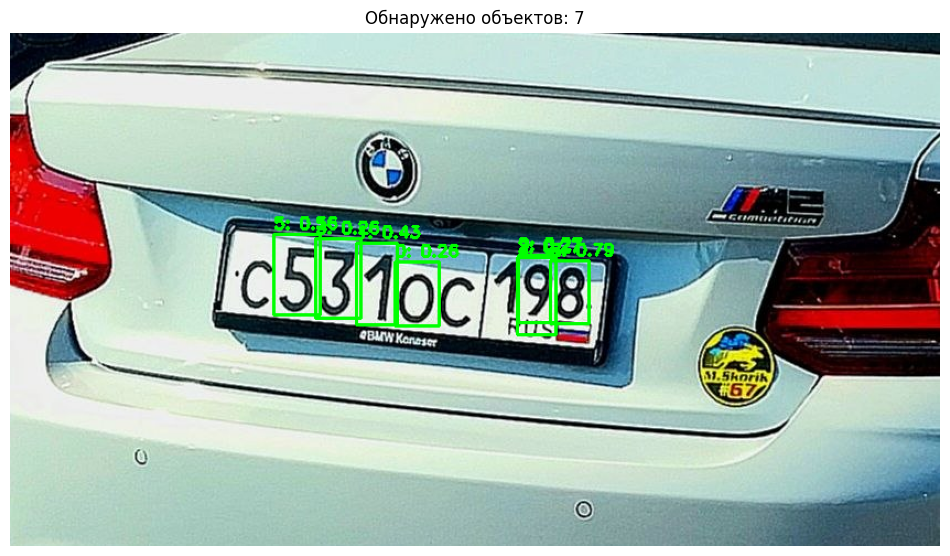

Найдено 7 объектов:
  1. Цифра 8, уверенность: 0.79, позиция: [490, 207, 525, 264]
  2. Цифра 5, уверенность: 0.56, позиция: [239, 183, 281, 256]
  3. Цифра 1, уверенность: 0.43, позиция: [314, 191, 351, 265]
  4. Цифра 9, уверенность: 0.27, позиция: [461, 202, 495, 263]
  5. Цифра 2, уверенность: 0.27, позиция: [460, 204, 495, 274]
  6. Цифра 0, уверенность: 0.26, позиция: [349, 208, 389, 266]
  7. Цифра 3, уверенность: 0.26, позиция: [277, 187, 318, 259]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_19.jpg

Обработка фото 23/25: 21.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/21.jpg: 384x640 1 0, 1 2, 1 6, 2 7s, 8.1ms
Speed: 3.4ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/21.jpg: 384x640 1 0, 1 2, 1 6, 2 7s, 7.4ms
Speed: 2.8ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


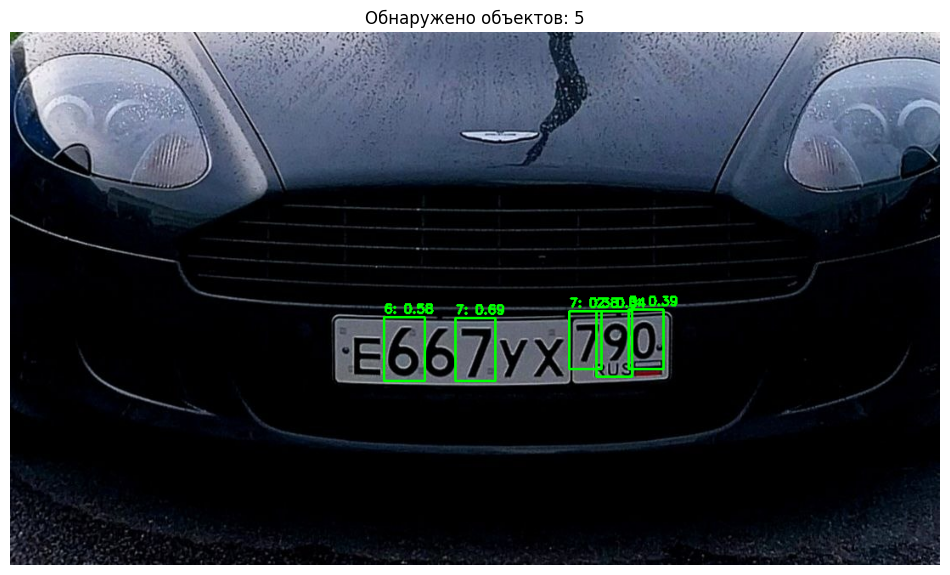

Найдено 5 объектов:
  1. Цифра 7, уверенность: 0.69, позиция: [524, 336, 571, 410]
  2. Цифра 6, уверенность: 0.58, позиция: [440, 335, 488, 410]
  3. Цифра 0, уверенность: 0.39, позиция: [728, 326, 769, 396]
  4. Цифра 7, уверенность: 0.38, позиция: [658, 328, 696, 396]
  5. Цифра 2, уверенность: 0.34, позиция: [690, 328, 732, 405]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_21.jpg

Обработка фото 24/25: 2.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/2.jpg: 544x640 (no detections), 9.3ms
Speed: 4.2ms preprocess, 9.3ms inference, 0.8ms postprocess per image at shape (1, 3, 544, 640)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/2.jpg: 544x640 (no detections), 7.6ms
Speed: 4.0ms preprocess, 7.6ms inference, 0.8ms postprocess per image at shape (1, 3, 544, 640)


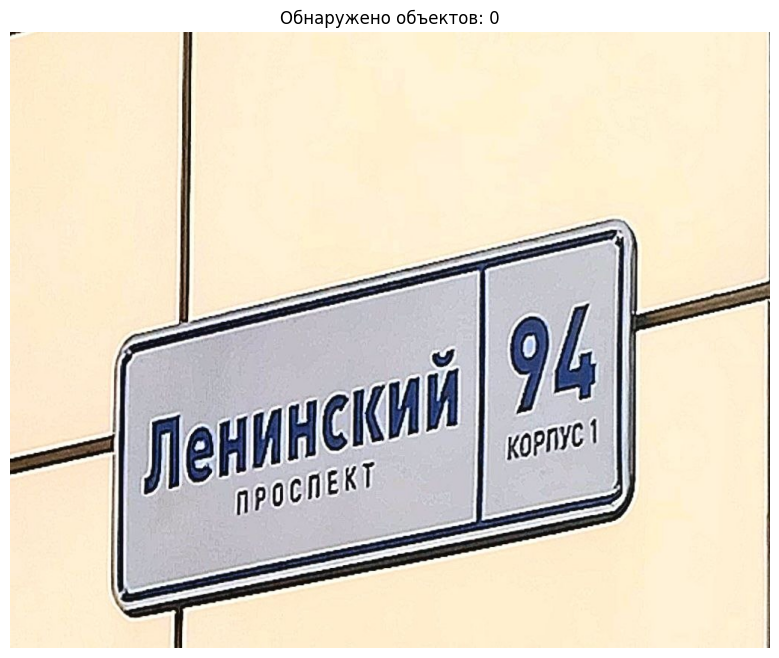

Найдено 0 объектов:
Результат сохранен: /content/drive/MyDrive/detection_results/detected_2.jpg

Обработка фото 25/25: 10.jpg

image 1/1 /content/drive/MyDrive/ML5lw/my_images/10.jpg: 640x608 1 0, 1 2, 1 3, 2 4s, 1 8, 8.8ms
Speed: 3.3ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 608)

image 1/1 /content/drive/MyDrive/ML5lw/my_images/10.jpg: 640x608 1 0, 1 2, 1 3, 2 4s, 1 8, 7.8ms
Speed: 3.1ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 608)


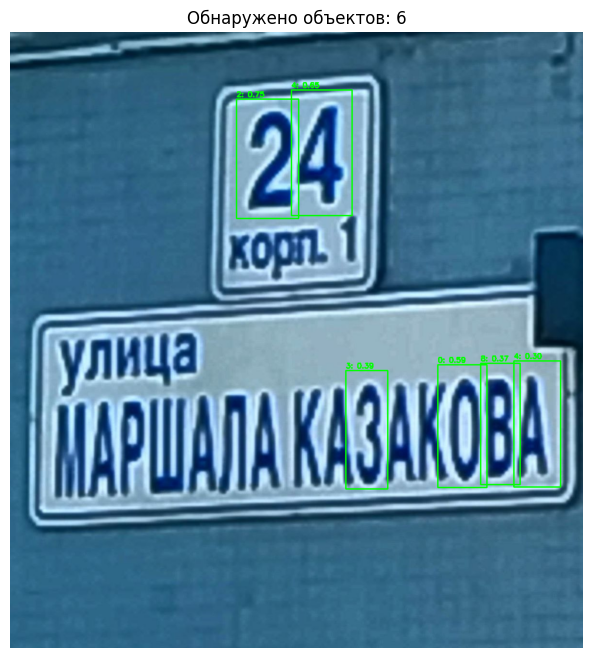

Найдено 6 объектов:
  1. Цифра 2, уверенность: 0.75, позиция: [470, 139, 599, 387]
  2. Цифра 4, уверенность: 0.65, позиция: [584, 120, 710, 381]
  3. Цифра 0, уверенность: 0.59, позиция: [888, 691, 990, 946]
  4. Цифра 3, уверенность: 0.39, позиция: [697, 703, 784, 949]
  5. Цифра 8, уверенность: 0.37, позиция: [977, 688, 1059, 940]
  6. Цифра 4, уверенность: 0.30, позиция: [1046, 683, 1143, 945]
Результат сохранен: /content/drive/MyDrive/detection_results/detected_10.jpg


In [16]:
print("обработка моих фотографий")
process_user_photos()